In [1]:
import sklearn
import numpy as np
import copy
import keras 
import xlrd
import pandas as pd 
import seaborn as sns
import datetime 
import matplotlib.pyplot as plt
plt.rc('figure', max_open_warning = 0)
plt.rcParams.update({'figure.max_open_warning': 0})
from numpy import mean
from numpy import std
from numpy import dstack
from scipy import signal, fftpack
from scipy.signal import savgol_filter
from pandas import read_csv
from matplotlib import pyplot
from random import shuffle, randint
import numpy
from sklearn.model_selection import train_test_split
# fix random seed for reproducibility
numpy.random.seed(7)
from datetime import datetime
pd.set_option('display.max_columns', 500)
pd.options.display.max_rows = 999
# go to upper folder 

Using TensorFlow backend.
/home/jurgen/.local/lib/python3.5/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/jurgen/.local/lib/python3.5/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/jurgen/.local/lib/python3.5/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/jurgen/.local/lib/python3.5/site-packages/tensorflow/python

In [2]:
cd ..

/home/iorgen/PycharmProjects/SygnalAnalysis


# Read additional legend file

In [3]:
legend = pd.read_csv("datasets/DATA/Nikol/Legend.csv", delimiter=",")
legend.head(900)

,Unnamed: 0,Линия 1,Линия 2,Unnamed: 3,Легенда для графика,Unnamed: 5,Unnamed: 6,Unnamed: 7,0,Unnamed: 9,9/8/2012
0,Data,28/02/19 17:15,28/02/19 17:15,NaN,Data,0,Дата и время,NaN,1.0,Data,Data
1,BT28500,45.30,44.70,NaN,BT28500,1,"Темп. воды из приямка, ⁰С",NaN,2.0,BT28500,BT28500
2,BT29000,45.30,44.90,NaN,BT29000,2,"Темп. воды до градильни, ⁰С",NaN,3.0,BT29000,BT29000
3,BT31200,8.80,13.90,NaN,BT31200,3,"Темп. воды охлаждения стенок КВО, подача, ⁰С",NaN,4.0,BT31200,BT31200
4,T22412,606.37,607.53,NaN,T22412,4,"Темп. дутьевого воздуха, ⁰С",NaN,5.0,T22412,T22412
5,F22410,7662.85,7519.73,NaN,F22410,5,"Расход дутьевого воздуха, Нм³/ч",NaN,6.0,F22410,F22410
6,P22400,52.91,43.94,NaN,P22400,6,"Давление на входе печь, мБар",NaN,7.0,P22400,P22400
7,T22323,800.29,838.21,NaN,T22323,7,"Темп. горелки Enetex, ⁰С",NaN,8.0,T22323,T22323
8,M10I,44.53,0.00,NaN,M10I,8,"Колесо 1, ток двигателя, А",NaN,9.0,M10I,M10I
9,M20I,43.55,0.00,NaN,M20I,9,"Колесо 2, ток двигателя, А",NaN,10.0,M20I,M20I


# Считаем и почистим данные, пока для простоты я удалил все данные с вхождением нуля, в будущем их нужно будеть заполнять, считая такие значения как пропуски

### Signal class with sensors data

In [4]:
class Signal:
    values = None
    smoothed_values = None
    
    target = None
    dates = pd.DataFrame() 
    def __init__(self, filepath="SOP1.txt"):
        self.filepath = filepath
        self.read_control_results()
        
    def read_control_results(self):
        self.values = pd.read_csv(self.filepath, encoding="cp1251", delimiter = ",")
        print("Number of columns:", len(self.values.columns))
        self.values = self.values.dropna(axis='columns')
        print("Number of columns after clean:", len(self.values.columns))
        corr_matrix = self.values.corr().abs()
        # Select upper triangle of correlation matrix
        upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
        # Find features with correlation greater than 0.95
        to_drop = [column for column in upper.columns if any(upper[column] > 0.90)]
        self.values = self.values.drop(to_drop, axis=1)
        print("Number of columns after corr analysis:",len(self.values.columns))
        self.values['Data'] =  pd.to_datetime(self.values['Data'])
        self.values['Iter_Data'] =  self.values['Data']        
        self.values = self.values.set_index('Data')
        print("NaN Values:", self.values.isna().any().any())
        self.values.info()
    
    def read_target(self):
        self.target = pd.read_csv('datasets/DATA/Nikol/plains_1.csv', delimiter=',')
        self.target = self.target.dropna()
        self.target = self.target.drop_duplicates(subset="END_DATE")
        self.target["test_index"] = 50
        self.target['START_DATE'] =  pd.to_datetime(self.target['START_DATE'])
        self.target['END_DATE'] =  pd.to_datetime(self.target['END_DATE'])
        self.target['Data'] = self.target['START_DATE']
        self.target = self.target.set_index('Data')
        self.target = self.target.sort_index()
        print("NaN Values:", self.target.isna().any().any())
        self.target.info()
    
    def clear_target(self):
        # target.loc[(target['REASON']!= 'Слив металла') & (target['REASON']!= 'Переход'), 'REASON'].size
        self.target = self.target.loc[(self.target['REASON']!= 'Слив металла') & (self.target['REASON']!= 'Переход'),
                            ['EQUIPMENT', 'REASON', 'START_DATE', 'END_DATE', 'ALL_PLAINS_TIME', 'test_index']]
        self.target['REASON'].value_counts()

        def parse_minutes(s):
            hours, minutes = s.split(':')
            return int(hours) * 60 + int(minutes)

        # Convert timedelta into minutes
        self.target['STOP_TIME'] = self.target.apply(lambda x: parse_minutes(x['ALL_PLAINS_TIME']), axis=1)
        print(self.target['STOP_TIME'].sum())

        # Уберем из значений промежутки в которые была остановка производственного процесса
        for idx,row in self.target.iterrows():
            if row['STOP_TIME'] == 0:
                print('Empty:', row['START_DATE']," --> ",row['END_DATE'])
                continue
            else: 
                print('Non Empty:', row['START_DATE']," --> ",row['END_DATE'])
                self.values = self.values.drop(self.values[(self.values["Iter_Data"] > row['START_DATE']) & 
                                                                (self.values["Iter_Data"] < row['END_DATE'])
                                                               ].index)
                
                self.smoothed_values = self.smoothed_values.drop(self.smoothed_values[(self.smoothed_values["Iter_Data"] > row['START_DATE']) & 
                                                                (self.smoothed_values["Iter_Data"] < row['END_DATE'])
                                                               ].index)
    
    def smooth_control_results(self):
        self.smoothed_values = copy.deepcopy(self.values)
        for cont_res in self.values:
            self.smoothed_values[cont_res] = savgol_filter(self.values[cont_res], 15, 3)
            
        self.smoothed_values['Iter_Data'] =  pd.to_datetime(self.smoothed_values['Iter_Data'])
    
        
    def load_target_variable(self, fiheadlepath):
        # TODO here should be loaded from target variables and checked them
        return 0
    
    def mark_target(self, left_delta):
        assert isinstance(left_delta, int)
        assert isinstance(self.target, pd.DataFrame)
        self.values["target_variable"] = 0
        self.smoothed_values["target_variable"] = 0
        for idx,row in self.target.iterrows():
            print(idx,' -----> ', )
            left_delta = pd.to_timedelta(left_delta,'m')
            filded_condition = ((self.values.index.to_pydatetime() <= row['START_DATE'])
                                &(self.values.index.to_pydatetime() >= row['START_DATE'] - left_delta))
            
            self.values.loc[filded_condition,'target_variable'] = 1
            self.smoothed_values.loc[filded_condition,'target_variable'] = 1
        
        print(self.values.target_variable.value_counts())
    
    def mark_self_target(self, left_delta, impulse_delta):
        output = list()
        assert isinstance(left_delta, int)
        assert isinstance(self.target, pd.DataFrame)
        self.values["target_variable"] = 0
        self.smoothed_values["target_variable"] = 0
        non_anomaly_set = signals.values.iloc[(signals.values['target_variable'] != 1).values]
        for idx, row in self.target.iterrows():
            print(idx, ' -----> ', )
            left_delta = pd.to_timedelta(left_delta, 'm')
            filded_condition = ((self.values.index.to_pydatetime() <= row['START_DATE'])
                                & (self.values.index.to_pydatetime() >= row['START_DATE'] - left_delta))

            self.values.loc[filded_condition, 'target_variable'] = 1
            self.smoothed_values.loc[filded_condition, 'target_variable'] = 1
            print('--->')
            condition = (self.values.index.to_pydatetime() <= row['START_DATE'])

            vl = self.values.iloc[condition].drop(columns=["Iter_Data"]).values[:impulse_delta]
            vl = np.array(vl)
            output.append(vl)
            print(vl.shape)

            clean_condition = (non_anomaly_set.index.to_pydatetime() <= row['START_DATE'])
            clear_target = non_anomaly_set.iloc[clean_condition].drop(columns=["Iter_Data"]).values[:impulse_delta]
            clear_target = np.array(clear_target)
            print(clear_target.shape)
            output.append(clear_target)

        # non_anomaly_set = signals.values.iloc[(signals.values['target_variable'] != 1).values]
        # for idx, row in self.target.iterrows():
        #     clean_condition = (non_anomaly_set.index.to_pydatetime() <= row['START_DATE'])
        #     clear_target = non_anomaly_set.iloc[clean_condition].drop(columns=["Iter_Data"]).values[:46]
        #     clear_target = np.array(clear_target)
        #     print(clear_target.shape)
        #     output.append(clear_target)

        # print(self.values.target_variable.value_counts())
        # output = [item for item in output if item.shape[0] == 46]
        self.special_marking_data = np.vstack(output)
        print(self.special_marking_data.shape)
        # Only with 30 time delta
        # self.special_marking_data = self.special_marking_data.reshape(77, impulse_delta, 41)
        

#     def stainar Ффункция по избавлению от автокорреляции 
    """ Display Functions """
    # TODO operation mode (jupyter and standart)
    def display_values(self):        
        for column in self.values.columns[1:]:
            plt.figure(figsize=(15,3))
            plt.title(column)
            plt.plot(self.values[column].values[:50000])
            plt.show()
            
    def display_smoothed_values(self):        
        for column in self.smoothed_values.columns[1:]:
            plt.figure(figsize=(15,3))
            plt.title(column)
            plt.plot(self.smoothed_values[column].values[:50000])
            plt.show()

In [5]:
3542/46

77.0

# Считаем исходный набор признаков 

In [16]:
signals = Signal("datasets/DATA/Nikol/L1_10-12.18.csv")

Number of columns: 96
Number of columns after clean: 85
Number of columns after corr analysis: 41
NaN Values: False
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 132398 entries, 2018-10-01 00:00:00 to 2018-12-31 23:58:00
Data columns (total 41 columns):
BT28500        132398 non-null float64
BT31200        132398 non-null float64
T22412         132398 non-null float64
F22410         132398 non-null float64
M10I           132398 non-null float64
M10pr          132398 non-null float64
BT33001        132398 non-null float64
M73000rpm      132398 non-null float64
NL             132398 non-null float64
NR             132398 non-null float64
Val1           132398 non-null float64
Val3           132398 non-null float64
Perfomance     132398 non-null float64
Speed          132398 non-null float64
BT22502        132398 non-null float64
M18500         132398 non-null float64
M19000         132398 non-null float64
M22600         132398 non-null float64
Plotnost       132398 non-null float6

In [17]:
# Smooth initiaul values 
signals.smooth_control_results()
signals.smoothed_values.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 132398 entries, 2018-10-01 00:00:00 to 2018-12-31 23:58:00
Data columns (total 41 columns):
BT28500        132398 non-null float64
BT31200        132398 non-null float64
T22412         132398 non-null float64
F22410         132398 non-null float64
M10I           132398 non-null float64
M10pr          132398 non-null float64
BT33001        132398 non-null float64
M73000rpm      132398 non-null float64
NL             132398 non-null float64
NR             132398 non-null float64
Val1           132398 non-null float64
Val3           132398 non-null float64
Perfomance     132398 non-null float64
Speed          132398 non-null float64
BT22502        132398 non-null float64
M18500         132398 non-null float64
M19000         132398 non-null float64
M22600         132398 non-null float64
Plotnost       132398 non-null float64
TimeWork       132398 non-null float64
M75000A        132398 non-null float64
Recycling      132398 non-null float

In [18]:
signals.values.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 132398 entries, 2018-10-01 00:00:00 to 2018-12-31 23:58:00
Data columns (total 41 columns):
BT28500        132398 non-null float64
BT31200        132398 non-null float64
T22412         132398 non-null float64
F22410         132398 non-null float64
M10I           132398 non-null float64
M10pr          132398 non-null float64
BT33001        132398 non-null float64
M73000rpm      132398 non-null float64
NL             132398 non-null float64
NR             132398 non-null float64
Val1           132398 non-null float64
Val3           132398 non-null float64
Perfomance     132398 non-null float64
Speed          132398 non-null float64
BT22502        132398 non-null float64
M18500         132398 non-null float64
M19000         132398 non-null float64
M22600         132398 non-null float64
Plotnost       132398 non-null float64
TimeWork       132398 non-null int64
M75000A        132398 non-null float64
Recycling      132398 non-null float64

In [19]:
# Read Target Value
signals.read_target()
# Clear and preproccessing target value 
signals.clear_target()
# Mark up target value into signals.values 
signals.mark_self_target(left_delta=30, impulse_delta=60)

NaN Values: False
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1070 entries, 2018-10-01 00:27:00 to 2019-01-31 21:51:00
Data columns (total 6 columns):
EQUIPMENT          1070 non-null object
REASON             1070 non-null object
START_DATE         1070 non-null datetime64[ns]
END_DATE           1070 non-null datetime64[ns]
ALL_PLAINS_TIME    1070 non-null object
test_index         1070 non-null int64
dtypes: datetime64[ns](2), int64(1), object(3)
memory usage: 58.5+ KB
9290
Non Empty: 2018-10-01 00:27:00  -->  2018-10-01 00:44:00
Non Empty: 2018-10-01 10:28:00  -->  2018-10-01 10:30:00
Non Empty: 2018-10-01 16:24:00  -->  2018-10-01 20:30:00
Non Empty: 2018-10-01 20:30:00  -->  2018-10-01 22:32:00
Non Empty: 2018-10-03 01:01:00  -->  2018-10-03 01:08:00
Non Empty: 2018-10-03 01:08:00  -->  2018-10-03 01:20:00
Non Empty: 2018-10-03 20:40:00  -->  2018-10-03 20:47:00
Non Empty: 2018-10-03 23:12:00  -->  2018-10-03 23:19:00
Non Empty: 2018-10-04 00:43:00  -->  2018-10-04 00:48:

Non Empty: 2018-11-21 17:51:00  -->  2018-11-21 18:00:00
Non Empty: 2018-11-22 10:48:00  -->  2018-11-22 10:54:00
Non Empty: 2018-11-22 12:40:00  -->  2018-11-22 12:52:00
Non Empty: 2018-11-23 21:34:00  -->  2018-11-23 21:46:00
Non Empty: 2018-11-24 21:31:00  -->  2018-11-24 22:26:00
Non Empty: 2018-11-25 02:34:00  -->  2018-11-25 02:46:00
Non Empty: 2018-11-25 06:07:00  -->  2018-11-25 06:19:00
Non Empty: 2018-11-25 21:55:00  -->  2018-11-25 22:07:00
Non Empty: 2018-11-25 22:21:00  -->  2018-11-25 22:26:00
Non Empty: 2018-11-25 23:28:00  -->  2018-11-25 23:40:00
Non Empty: 2018-11-27 01:59:00  -->  2018-11-27 02:11:00
Non Empty: 2018-11-27 05:09:00  -->  2018-11-27 05:18:00
Non Empty: 2018-11-27 10:58:00  -->  2018-11-27 11:19:00
Non Empty: 2018-11-27 18:04:00  -->  2018-11-27 18:16:00
Non Empty: 2018-11-27 19:28:00  -->  2018-11-27 19:36:00
Non Empty: 2018-11-27 21:05:00  -->  2018-11-27 21:11:00
Non Empty: 2018-11-28 21:46:00  -->  2018-11-28 21:58:00
Non Empty: 2018-11-29 04:42:00 

(60, 41)
2018-10-25 09:32:00  -----> 
--->
(60, 41)
(60, 41)
2018-10-25 11:11:00  -----> 
--->
(60, 41)
(60, 41)
2018-10-25 16:19:00  -----> 
--->
(60, 41)
(60, 41)
2018-10-25 16:31:00  -----> 
--->
(60, 41)
(60, 41)
2018-10-25 18:37:00  -----> 
--->
(60, 41)
(60, 41)
2018-10-25 23:35:00  -----> 
--->
(60, 41)
(60, 41)
2018-10-28 03:04:00  -----> 
--->
(60, 41)
(60, 41)
2018-10-28 03:07:00  -----> 
--->
(60, 41)
(60, 41)
2018-10-28 21:55:00  -----> 
--->
(60, 41)
(60, 41)
2018-10-29 22:03:00  -----> 
--->
(60, 41)
(60, 41)
2018-10-31 14:02:00  -----> 
--->
(60, 41)
(60, 41)
2018-11-01 03:11:00  -----> 
--->
(60, 41)
(60, 41)
2018-11-01 04:26:00  -----> 
--->
(60, 41)
(60, 41)
2018-11-01 07:10:00  -----> 
--->
(60, 41)
(60, 41)
2018-11-01 07:29:00  -----> 
--->
(60, 41)
(60, 41)
2018-11-01 07:36:00  -----> 
--->
(60, 41)
(60, 41)
2018-11-01 08:30:00  -----> 
--->
(60, 41)
(60, 41)
2018-11-02 10:00:00  -----> 
--->
(60, 41)
(60, 41)
2018-11-02 10:12:00  -----> 
--->
(60, 41)
(60, 41)
201

--->
(60, 41)
(60, 41)
2018-12-25 21:31:00  -----> 
--->
(60, 41)
(60, 41)
2018-12-26 00:36:00  -----> 
--->
(60, 41)
(60, 41)
2018-12-26 01:55:00  -----> 
--->
(60, 41)
(60, 41)
2018-12-26 06:33:00  -----> 
--->
(60, 41)
(60, 41)
2018-12-26 09:28:00  -----> 
--->
(60, 41)
(60, 41)
2018-12-26 09:46:00  -----> 
--->
(60, 41)
(60, 41)
2018-12-26 10:12:00  -----> 
--->
(60, 41)
(60, 41)
2018-12-26 17:54:00  -----> 
--->
(60, 41)
(60, 41)
2018-12-26 20:16:00  -----> 
--->
(60, 41)
(60, 41)
2018-12-28 11:00:00  -----> 
--->
(60, 41)
(60, 41)
2018-12-28 12:32:00  -----> 
--->
(60, 41)
(60, 41)
2018-12-30 10:31:00  -----> 
--->
(60, 41)
(60, 41)
2018-12-30 10:43:00  -----> 
--->
(60, 41)
(60, 41)
2018-12-31 12:33:00  -----> 
--->
(60, 41)
(60, 41)
(27416, 41)


# Data Visualization. 
density, values and smoothed values display  functions

In [12]:
def display_values(value_frame):
    assert isinstance(value_frame, pd.DataFrame)
    for column in value_frame.columns[1:]:
        plt.figure(figsize=(15,3))
        plt.title(column)
        plt.plot(value_frame[column].values[:1000])
        plt.show()
    

def display_target(target_frame):
    assert isinstance(target_frame, pd.DataFrame)
    for column in target_frame.columns:
        plt.figure(figsize=(15,3))
        plt.title(column)
        plt.plot(target_frame.index.to_pydatetime()[:20], dataframe[column].values[:20])
        plt.show()
        
def display_autocorrelation(value_frame):
    assert isinstance(value_frame,pd.DataFrame)
    for column in value_frame.columns:
        plt.figure(figsize=(15,5))
        plt.title(column)
        pd.plotting.autocorrelation_plot(pd.to_numeric(signals.values[column][0:4000]))
        plt.show()

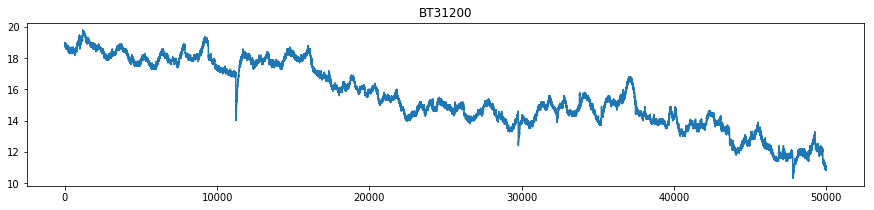

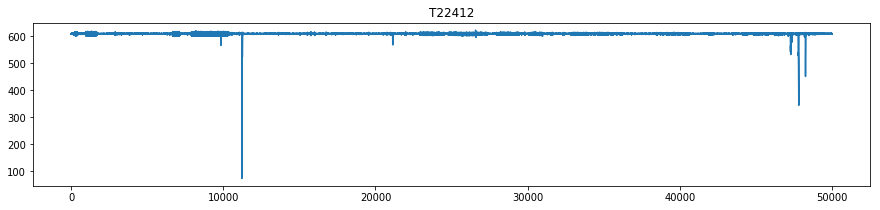

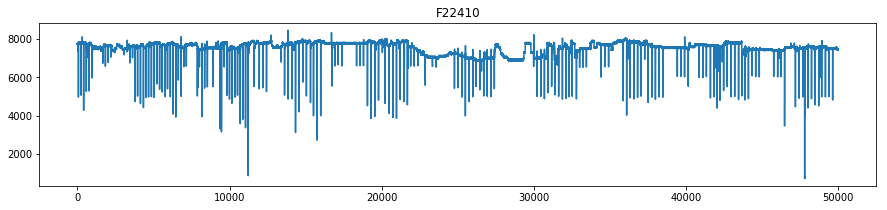

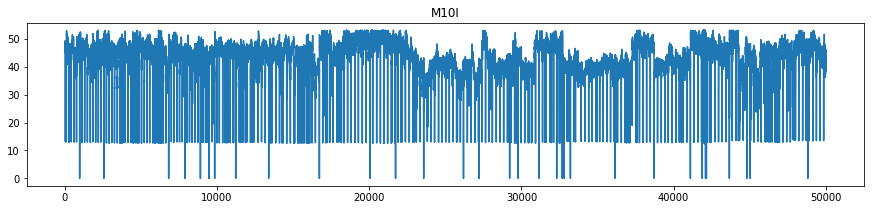

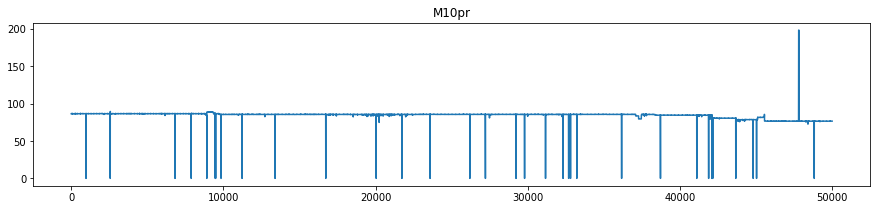

...

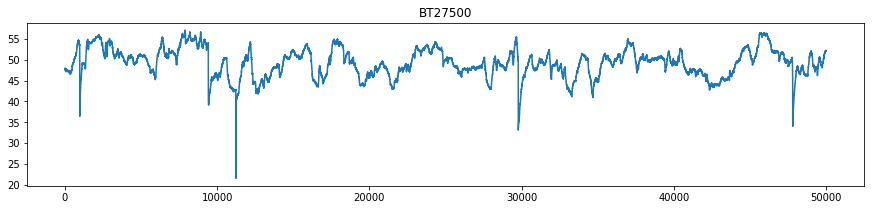

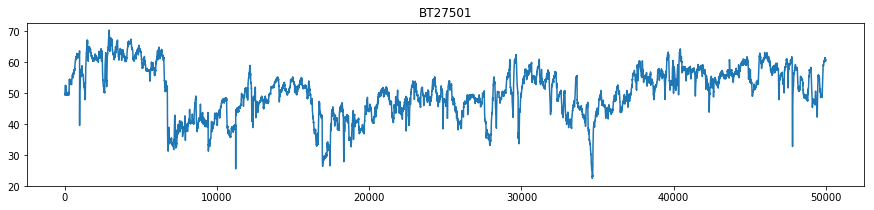

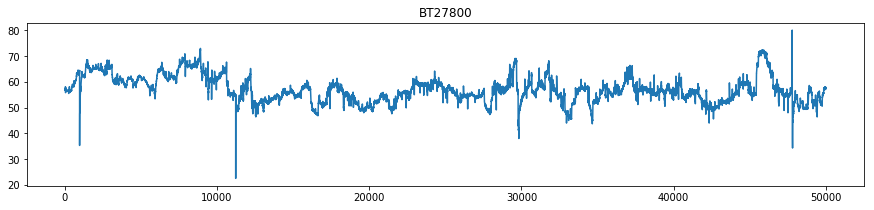

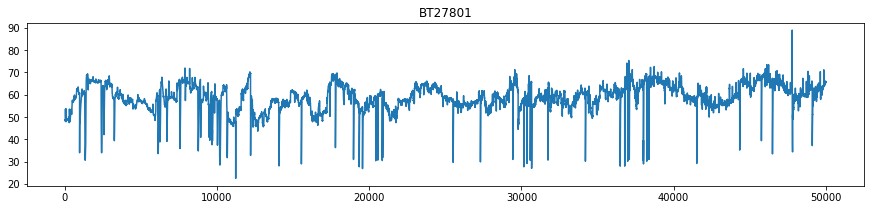

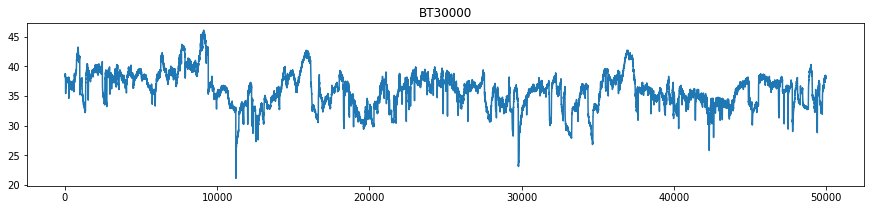

/usr/local/lib/python3.5/dist-packages/pandas/plotting/_converter.py:129: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


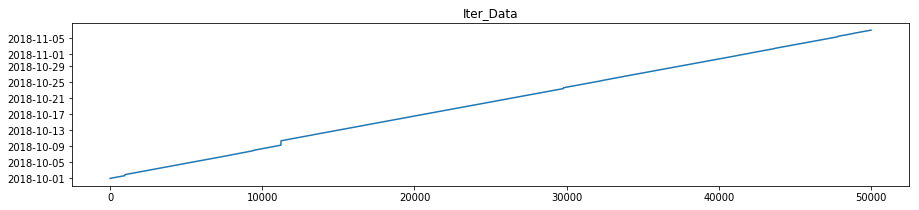

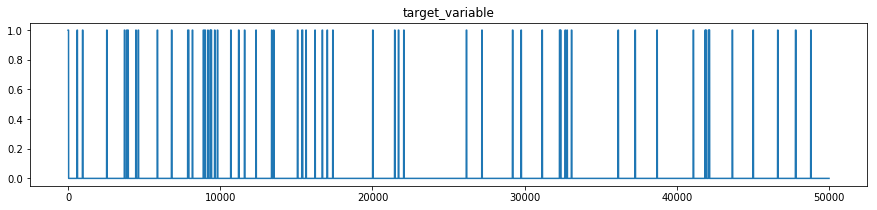

In [8]:
signals.display_values()

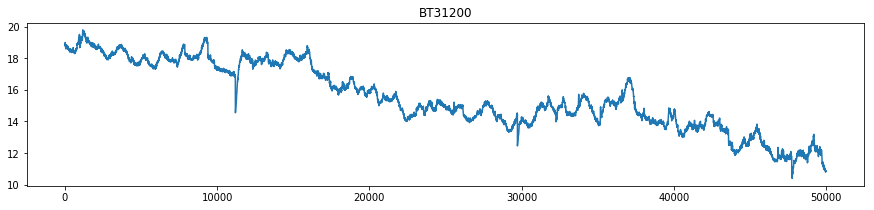

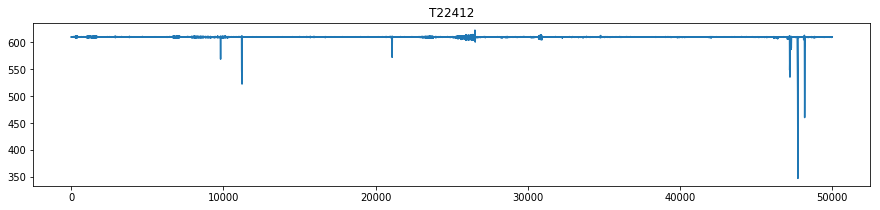

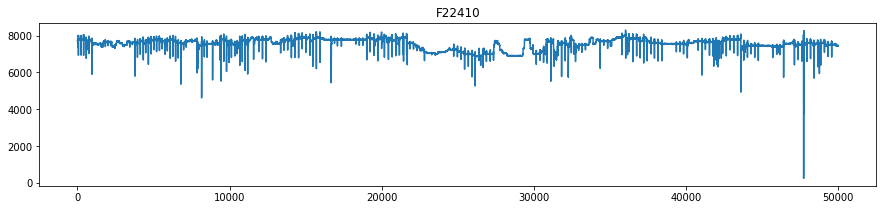

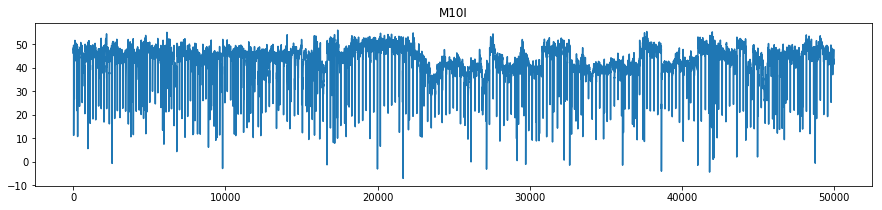

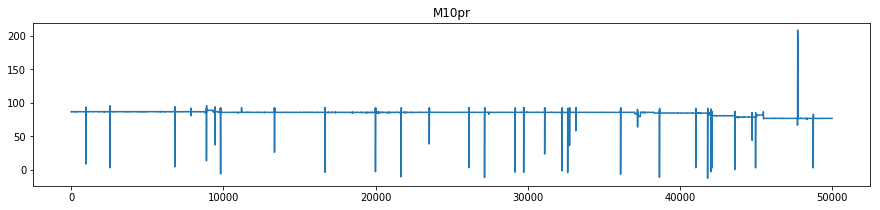

...

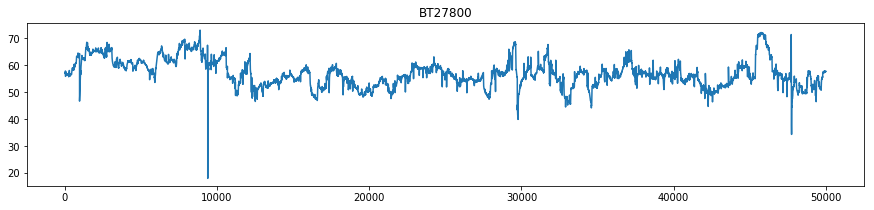

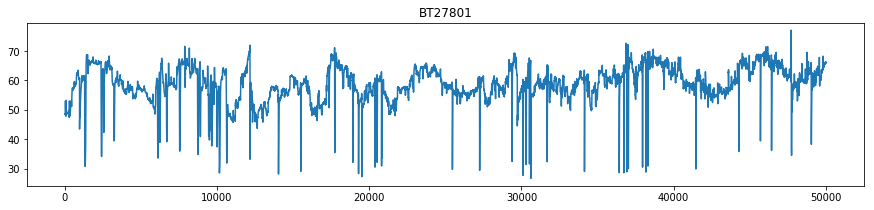

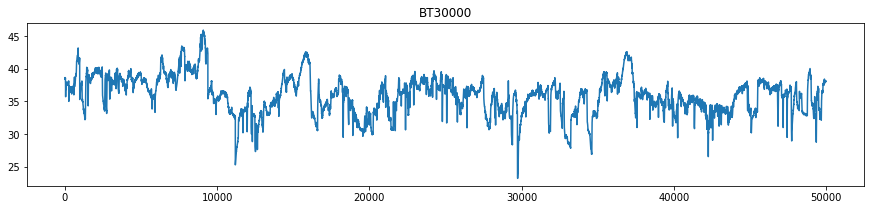

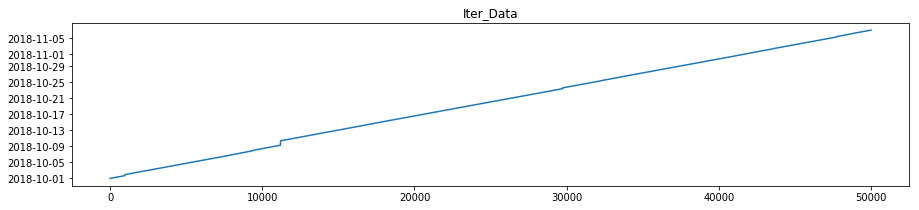

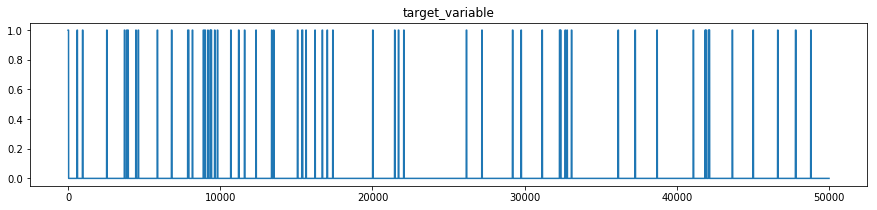

In [9]:
signals.display_smoothed_values()

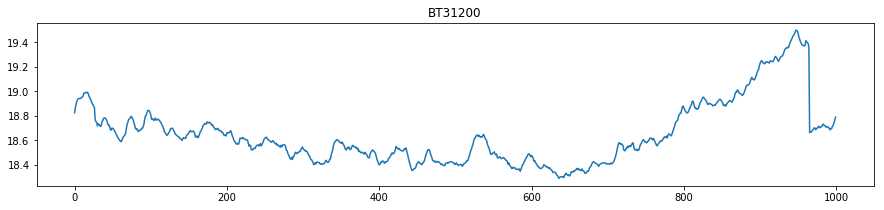

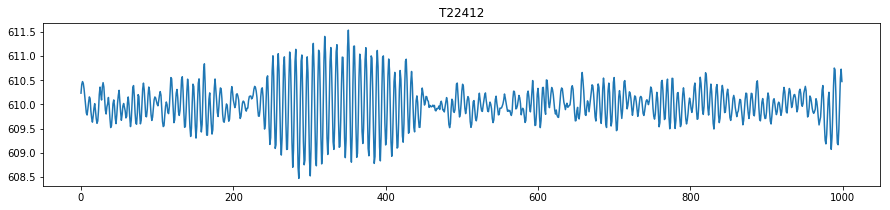

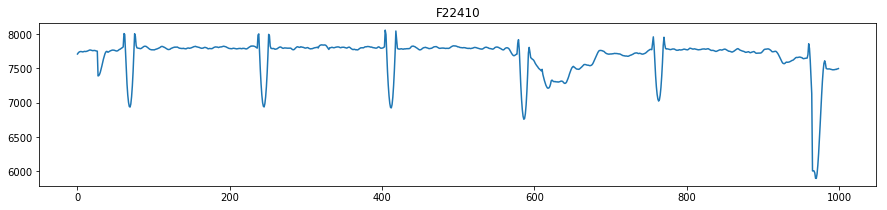

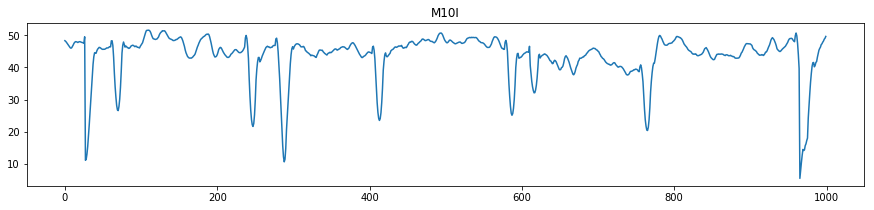

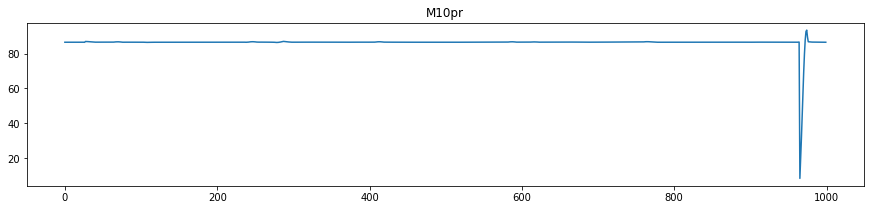

...

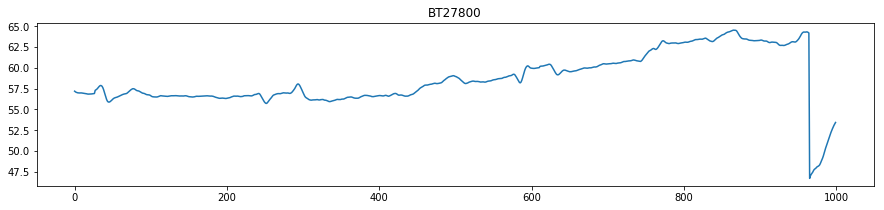

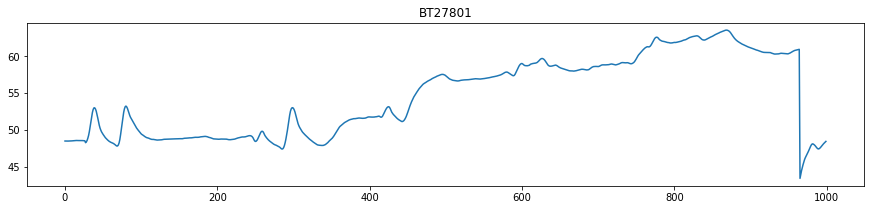

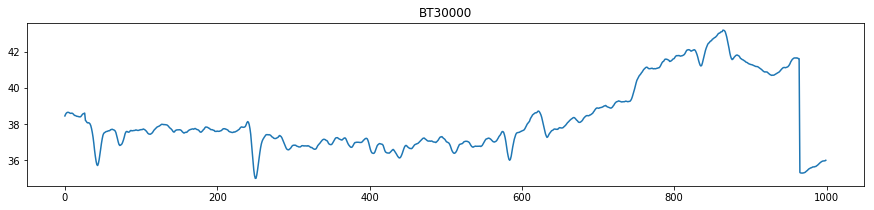

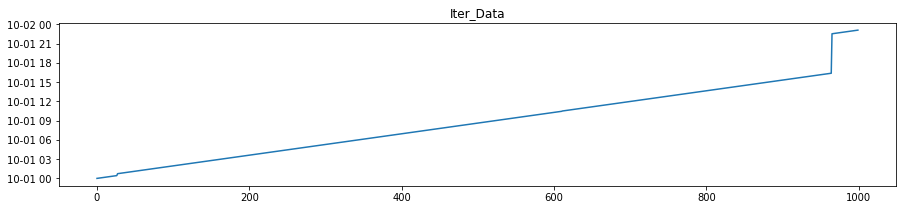

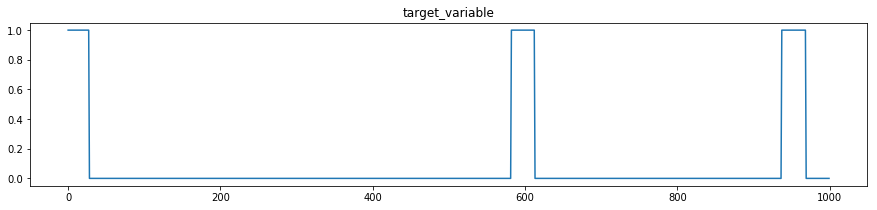

In [13]:
display_values(signals.smoothed_values)

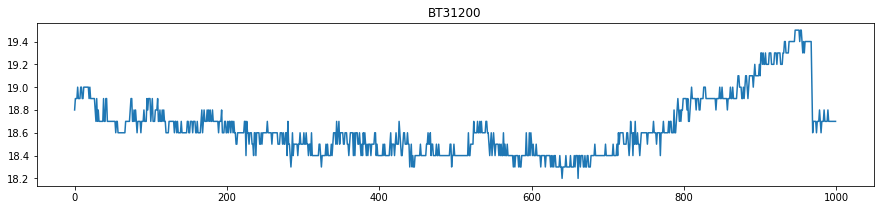

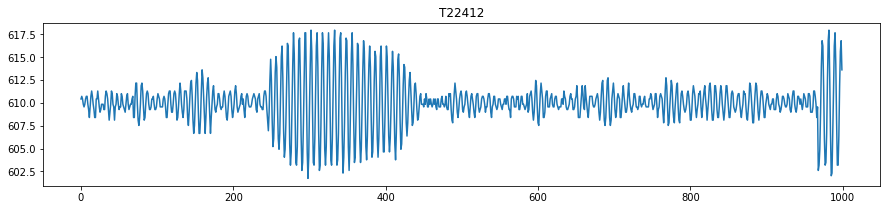

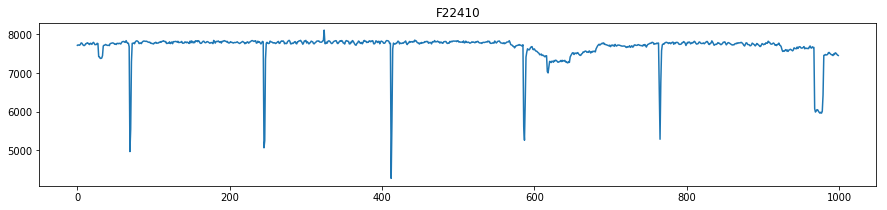

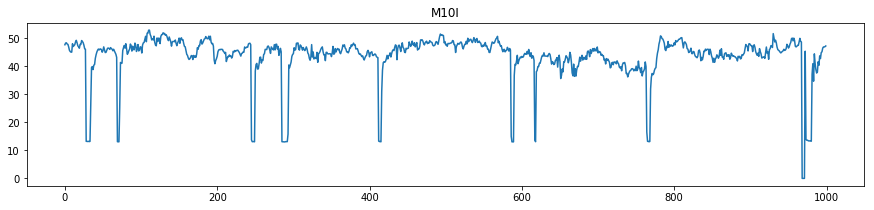

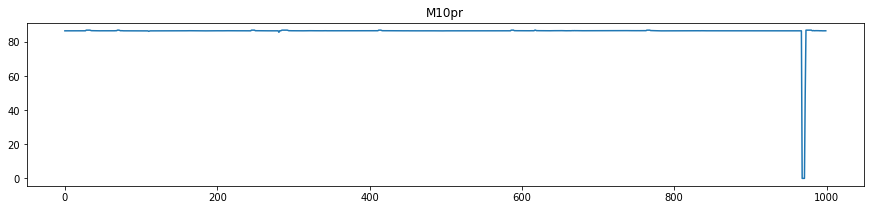

...

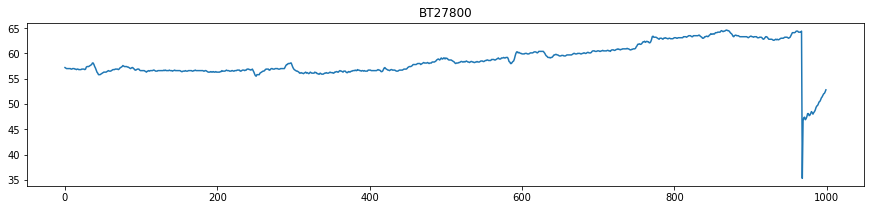

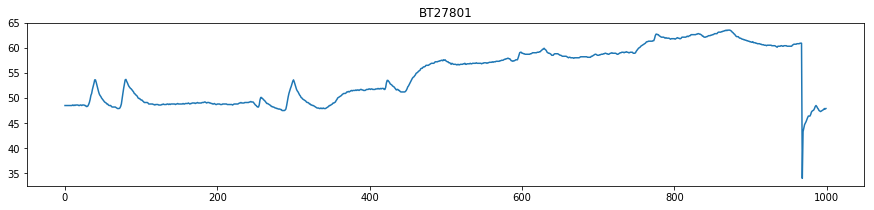

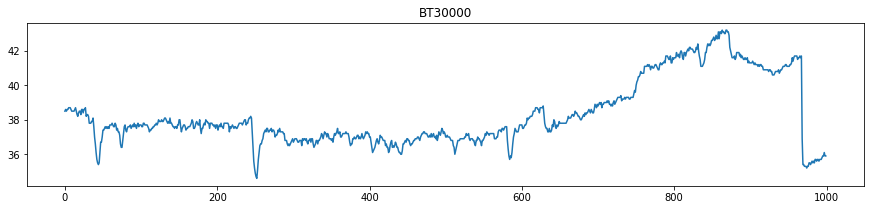

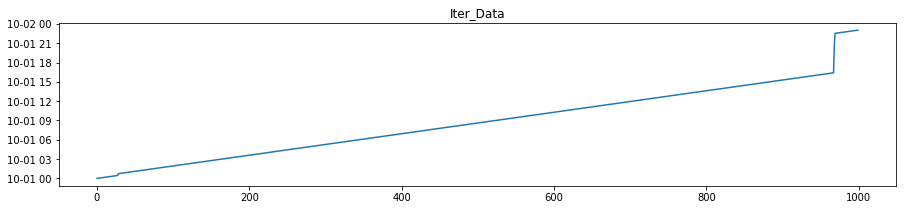

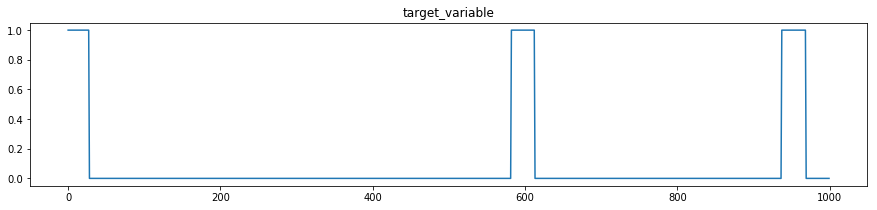

In [14]:
display_values(signals.values)

# Save smooth and initial values

In [ ]:
signals.values.to_csv('mark_up_data.csv')
signals.smoothed_values.to_csv('smooth_mark_up_data.csv')

In [ ]:
# Need onclude into Signal class 

In [12]:
import sys
import warnings
warnings.filterwarnings('ignore')
from tqdm import tqdm

import pandas as pd
import numpy as np
from sklearn.metrics import mean_absolute_error, mean_squared_error

import statsmodels.formula.api as smf
import statsmodels.tsa.api as smt
import statsmodels.api as sm
import scipy.stats as scs
from scipy.optimize import minimize

import matplotlib.pyplot as plt

In [13]:
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from plotly import graph_objs as go
init_notebook_mode(connected = True)

def plotly_df(df, title = ''):
    data = []
    trace = go.Scatter(
            x = df.index,
            y = df["BT32600"],
            mode = 'lines',
            name = "Value"
        )
    data.append(trace)
    layout = dict(title = title)
    fig = dict(data = data, layout = layout)
    iplot(fig, show_link=False)

plotly_df(signals.values, title = "Separate Data")

# Operations above features

### Example of bringing a series to stationary values

In [22]:
import sys
import warnings
warnings.filterwarnings('ignore')
from tqdm import tqdm

import pandas as pd
import numpy as np
from sklearn.metrics import mean_absolute_error, mean_squared_error

import statsmodels.formula.api as smf
import statsmodels.tsa.api as smt
import statsmodels.api as sm
import scipy.stats as scs
from scipy.optimize import minimize

import matplotlib.pyplot as plt

In [29]:
testing_signal = "Plotnost"

Критерий Дики-Фуллера: p=0.330557


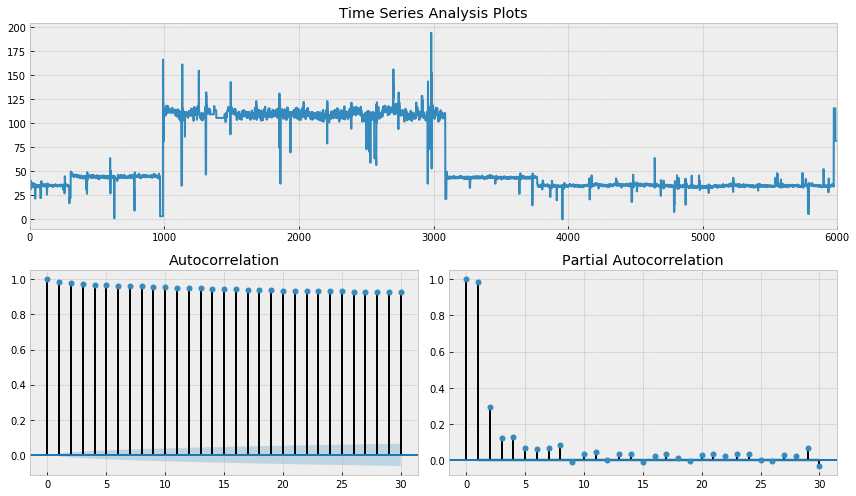

In [30]:
def tsplot(y, lags=None, figsize=(12, 7), style='bmh'):
    if not isinstance(y, pd.Series):
        y = pd.Series(y)
    with plt.style.context(style):    
        fig = plt.figure(figsize=figsize)
        layout = (2, 2)
        ts_ax = plt.subplot2grid(layout, (0, 0), colspan=2)
        acf_ax = plt.subplot2grid(layout, (1, 0))
        pacf_ax = plt.subplot2grid(layout, (1, 1))

        y.plot(ax=ts_ax)
        ts_ax.set_title('Time Series Analysis Plots')
        smt.graphics.plot_acf(y, lags=lags, ax=acf_ax, alpha=0.5)
        smt.graphics.plot_pacf(y, lags=lags, ax=pacf_ax, alpha=0.5)

        print("Критерий Дики-Фуллера: p=%f" % sm.tsa.stattools.adfuller(y)[1])

        plt.tight_layout()
    return 

tsplot(signals.values[testing_signal].values[:6000], lags=30)

                     BT28500  BT31200    T22412    F22410      M10I     M10pr  \
Data                                                                            
2018-10-01 00:00:00     72.5     18.8  610.4197  7718.278  47.62376  86.54375   
2018-10-01 00:01:00     72.5     18.9  610.7091  7729.532  48.24580  86.54375   
2018-10-01 00:02:00     72.2     18.9  610.4197  7723.289  48.31686  86.54375   
2018-10-01 00:03:00     72.0     18.9  609.8408  7720.808  47.87905  86.55000   
2018-10-01 00:04:00     72.0     19.0  609.5514  7744.606  47.76055  86.55000   

                     BT33001  M73000rpm        NL        NR      Val1  \
Data                                                                    
2018-10-01 00:00:00      9.3     835.00  436.1606  634.0553  338.4006   
2018-10-01 00:01:00      9.4     834.85  437.1268  635.8269  338.4556   
2018-10-01 00:02:00      9.6     835.05  436.7175  635.4152  338.0021   
2018-10-01 00:03:00      9.5     835.05  437.4365  635.6696  338.34

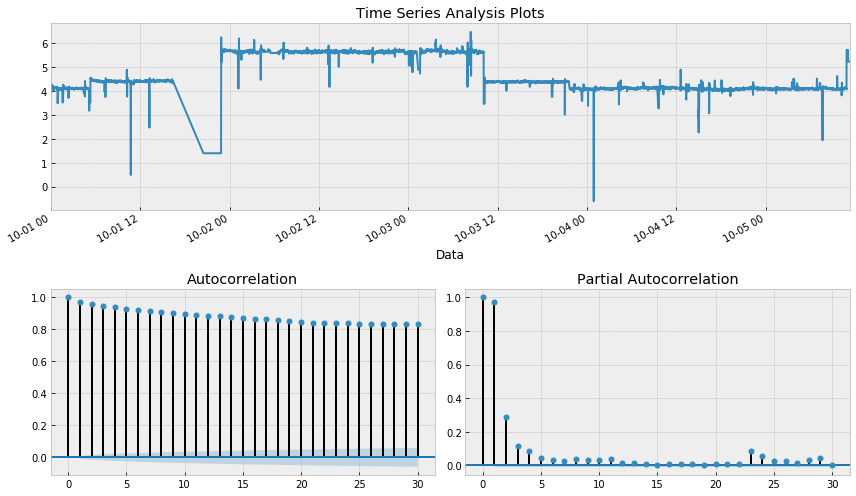

In [31]:
def invboxcox(y,lmbda):
    # обрабтное преобразование Бокса-Кокса
    if lmbda == 0:
        return(np.exp(y))
    else:
        return(np.exp(np.log(lmbda*y+1)/lmbda))

data = signals.values[:6000].copy()
print(data.head())
data['Value_box_koks'], lmbda = scs.boxcox(data[testing_signal]+1) # прибавляем единицу, так как в исходном ряде есть нули
tsplot(data["Value_box_koks"], lags=30)
print("Оптимальный параметр преобразования Бокса-Кокса: %f" % lmbda)

Критерий Дики-Фуллера: p=0.316242


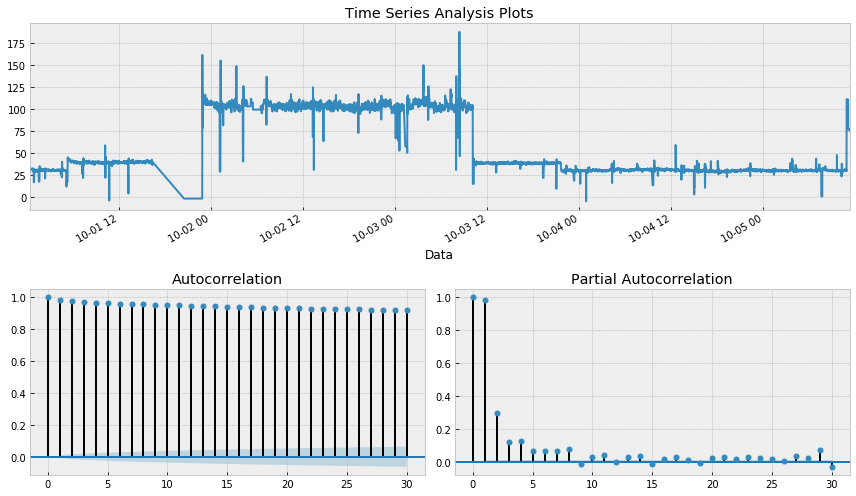

In [35]:
data['Value_box_koks_season'] = data[testing_signal] - data["Value_box_koks"].shift(24)
tsplot(data['Value_box_koks_season'][24:], lags=30)

### Feature enginering 

### another ways to smooth signals 

In [14]:
# Скользящее среднее 
def moving_average(series, n):
    return np.average(series[-n:])

def plotMovingAverage(series, n):880

    """
    series - dataframe with timeseries
    n - rolling window size 

    """

    rolling_mean = series.rolling(window=n).mean()

    plt.figure(figsize=(15,5))
    plt.title("Moving average\n window size = {}".format(n))
    plt.plot(rolling_mean, "g", label="Rolling mean trend")

    #plt.plot(upper_bond, "r--", label="Upper Bond / Lower Bond")
    #plt.plot(lower_bond, "r--")
    plt.plot(series, label="Actual values")
    plt.legend(loc="upper left")
    plt.grid(True)
    
plotMovingAverage(signals.values["Temp_Enetex"][14000: 14000 + 1000], 12) # сглаживаем по дням
plotMovingAverage(signals.values["Temp_Enetex"][14000: 14000 + 1000], 24) # сглаживаем по неделям

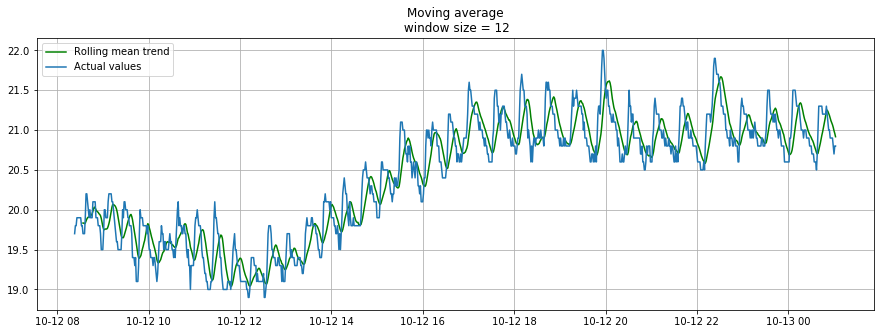

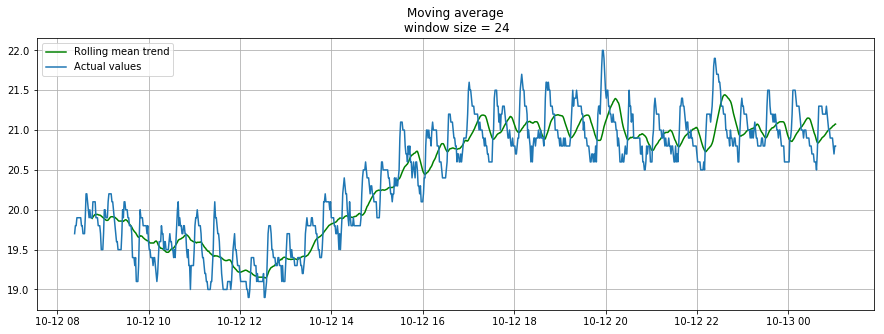

In [15]:
def exponential_smoothing(series, alpha):
    result = [series[0]] # first value is same as series
    for n in range(1, len(series)):
        result.append(alpha * series[n] + (1 - alpha) * result[n-1])
    return result

with plt.style.context('seaborn-white'):    
    plt.figure(figsize=(20, 8))
    for alpha in [0.3, 0.05]:
        plt.plot(exponential_smoothing(signals.values["Temp_Enetex"][:1000], alpha), label="Alpha {}".format(alpha))
    plt.plot(signals.values["Temp_Enetex"][:1000].values, "c", label = "Actual")
    plt.legend(loc="best")
    plt.axis('tight')
    plt.title("Exponential Smoothing")
    plt.grid(True)

Exponential smoothing

# Data preparation

In [21]:
print(signals.special_marking_data.shape)

(27416, 41)


In [28]:
27360/60

456.0

In [23]:
signals.special_marking_data = signals.special_marking_data[56:]
signals.special_marking_data.shape

(27360, 41)

In [26]:
signals.special_marking_data = signals.special_marking_data.reshape(int(27360/60), 60, 41)

In [30]:
X = signals.special_marking_data[:,:,:40]
Y = signals.special_marking_data[:,:,40]
print(X.shape)
Y = Y.reshape(456,60,1)
print(Y.shape)

(456, 60, 40)
(456, 60, 1)


In [31]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.15, random_state=42)

In [32]:
print('train X shape: ', X_train.shape)
print('train Y shape: ', Y_train.shape)
print('test X shape: ', X_test.shape)
print('test Y shape: ', Y_test.shape)

train X shape:  (387, 60, 40)
train Y shape:  (387, 60, 1)
test X shape:  (69, 60, 40)
test Y shape:  (69, 60, 1)


In [2]:
from keras.layers import Input, Dense, LSTM, MaxPooling1D, Conv1D
from keras.models import Model
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import TimeDistributed
from keras.layers import Bidirectional
from keras.layers.core import Dense, Activation, Dropout
from keras.layers.recurrent import GRU, LSTM
from keras.layers import Bidirectional, Dense
from keras.optimizers import Adam

input_layer = Input(shape=(60, 40))
conv1 = Conv1D(filters=32,
               kernel_size=8,
               strides=1,
               activation='relu',
               padding='same')(input_layer)
lstm1 = Bidirectional(LSTM(64,return_sequences=True))(conv1)
lstm2 = Bidirectional(LSTM(64,return_sequences=True))(lstm1)
output_layer = GRU(1, activation="sigmoid", return_sequences=True)(lstm2)
model = Model(inputs=input_layer, outputs=output_layer)
model.compile(loss="binary_crossentropy", optimizer="Adam")

ImportError: No module named 'keras'

In [ ]:
from keras.utils import plot_model
plot_model(model, to_file='model.png')


In [45]:
from sklearn.model_selection import TimeSeriesSplit

tscv = TimeSeriesSplit(n_splits=12)
print(tscv)  

for train_index, test_index in tscv.split(X_train):
    print("TRAIN:", train_index, "TEST:", test_index)
    train_x, test_x = X_train[train_index], X_train[test_index]
    train_y, test_y = Y_train[train_index], Y_train[test_index]
    print(train_x.shape)
    model.fit(train_x, train_y, epochs=30, batch_size=2)
    scores = model.evaluate(test_x, test_y, verbose=1)
    print('test_binary_crossentropy=%f' % scores)
    
print(model.evaluate(X_test, Y_test, verbose=1))
print(model.evaluate(X_train, Y_train, verbose=1))

model_json_name = "model_special_markup_t30_dirty.json"
model_h5_name = "model_special_markup_t30_dirty.h5"

# serialize model to JSON
model_json = model.to_json()
with open(model_json_name, "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
model.save_weights(model_h5_name)
print("Saved model to disk")

TimeSeriesSplit(max_train_size=None, n_splits=12)
TRAIN: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38] TEST: [39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62
 63 64 65 66 67]
(39, 60, 40)
Epoch 1/30
39/39 [==============================] - 5s 131ms/step - loss: 0.5109
Epoch 2/30
39/39 [==============================] - 2s 39ms/step - loss: 0.4352
Epoch 3/30
39/39 [==============================] - 2s 40ms/step - loss: 0.4892
Epoch 4/30
39/39 [==============================] - 2s 39ms/step - loss: 0.4113
Epoch 5/30
39/39 [==============================] - 2s 40ms/step - loss: 0.3891
Epoch 6/30
39/39 [==============================] - 2s 41ms/step - loss: 0.3651
Epoch 7/30
39/39 [==============================] - 2s 40ms/step - loss: 0.3726
Epoch 8/30
39/39 [==============================] - 2s 40ms/step - loss: 0.4063
Epoch 9/30
39/39 [==============================] - 2s 41ms/step - loss: 

Epoch 5/30
184/184 [==============================] - 7s 38ms/step - loss: 0.3261
Epoch 6/30
184/184 [==============================] - 7s 38ms/step - loss: 0.3243
Epoch 7/30
184/184 [==============================] - 7s 38ms/step - loss: 0.3238
Epoch 8/30
184/184 [==============================] - 7s 38ms/step - loss: 0.3245
Epoch 9/30
184/184 [==============================] - 7s 38ms/step - loss: 0.3247
Epoch 10/30
184/184 [==============================] - 7s 38ms/step - loss: 0.3247
Epoch 11/30
184/184 [==============================] - 7s 38ms/step - loss: 0.3242
Epoch 12/30
184/184 [==============================] - 7s 38ms/step - loss: 0.3243
Epoch 13/30
184/184 [==============================] - 7s 38ms/step - loss: 0.3241
Epoch 14/30
184/184 [==============================] - 7s 40ms/step - loss: 0.3240
Epoch 15/30
184/184 [==============================] - 7s 38ms/step - loss: 0.3250
Epoch 16/30
184/184 [==============================] - 7s 38ms/step - loss: 0.3237
Epoch 17/

242/242 [==============================] - 9s 38ms/step - loss: 0.3254
Epoch 17/30
242/242 [==============================] - 9s 38ms/step - loss: 0.3244
Epoch 18/30
242/242 [==============================] - 9s 38ms/step - loss: 0.3245
Epoch 19/30
242/242 [==============================] - 9s 38ms/step - loss: 0.3244
Epoch 20/30
242/242 [==============================] - 9s 38ms/step - loss: 0.3240
Epoch 21/30
242/242 [==============================] - 9s 38ms/step - loss: 0.3240
Epoch 22/30
242/242 [==============================] - 9s 39ms/step - loss: 0.3240
Epoch 23/30
242/242 [==============================] - 9s 39ms/step - loss: 0.3237
Epoch 24/30
242/242 [==============================] - 9s 39ms/step - loss: 0.3240
Epoch 25/30
242/242 [==============================] - 9s 39ms/step - loss: 0.3239
Epoch 26/30
242/242 [==============================] - 10s 40ms/step - loss: 0.3238
Epoch 27/30
242/242 [==============================] - 9s 39ms/step - loss: 0.3236
Epoch 28/30
242

358/358 [==============================] - 14s 39ms/step - loss: 0.3237
Epoch 20/30
358/358 [==============================] - 14s 39ms/step - loss: 0.3241
Epoch 21/30
358/358 [==============================] - 14s 39ms/step - loss: 0.3237
Epoch 22/30
358/358 [==============================] - 14s 39ms/step - loss: 0.3236
Epoch 23/30
358/358 [==============================] - 14s 39ms/step - loss: 0.3238
Epoch 24/30
358/358 [==============================] - 14s 39ms/step - loss: 0.3238
Epoch 25/30
358/358 [==============================] - 14s 40ms/step - loss: 0.3236
Epoch 26/30
358/358 [==============================] - 14s 39ms/step - loss: 0.3237
Epoch 27/30
358/358 [==============================] - 14s 39ms/step - loss: 0.3236
Epoch 28/30
358/358 [==============================] - 14s 39ms/step - loss: 0.3236
Epoch 29/30
358/358 [==============================] - 14s 39ms/step - loss: 0.3236
Epoch 30/30
29/29 [==============================] - 0s 859us/step
test_binary_crossentr

In [46]:
print('train X shape: ', X_train.shape)
print('train Y shape: ', Y_train.shape)
print('test X shape: ', X_test.shape)
print('test Y shape: ', Y_test.shape)

from keras.models import model_from_json
json_file = open(model_json_name, 'r')
loaded_model_json = json_file.read()
json_file.close()
model_dirty = model_from_json(loaded_model_json)
# load weights into new model
model_dirty.load_weights(model_h5_name)
print("Loaded TRANSVERS model from disk")


test_prediction = model_dirty.predict(X_test, verbose=1)
train_prediciton = model_dirty.predict(X_train, verbose=1)

print(test_prediction.shape)
print(train_prediciton.shape)

visualize_test_prediction = test_prediction.reshape(69*60,1)
visualize_train_prediction = train_prediciton.reshape(387*60,1)

visualize_test_real = Y_test.reshape(69*60,1)
visualize_train_real = Y_train.reshape(387*60,1)


train X shape:  (387, 60, 40)
train Y shape:  (387, 60, 1)
test X shape:  (69, 60, 40)
test Y shape:  (69, 60, 1)
Loaded TRANSVERS model from disk
387/387 [==============================] - 0s 810us/step
(69, 60, 1)
(387, 60, 1)


In [48]:
start = 0 
stop = 5000

# plot train prediction

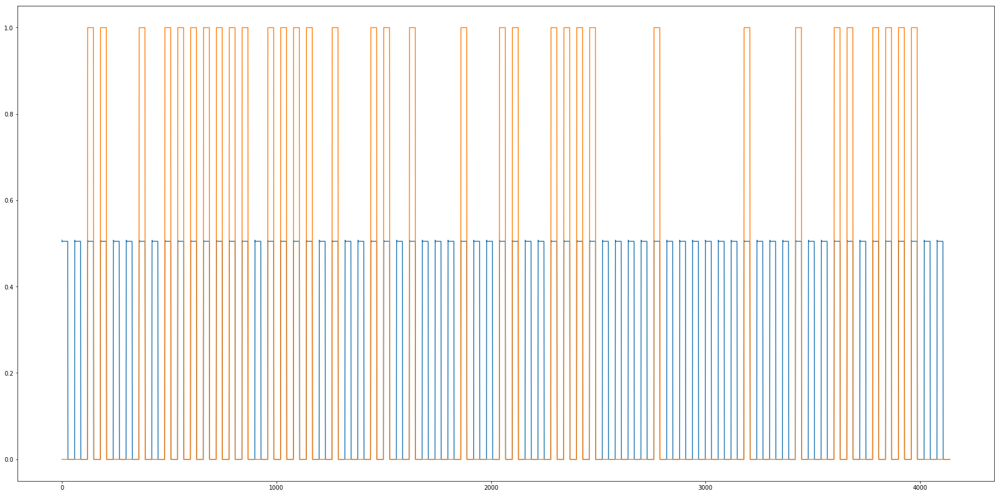

In [49]:
plt.figure(figsize=(30,15))
plt.plot(visualize_test_prediction[start:stop])
plt.plot(visualize_test_real[start:stop])
plt.plot()
# plt.savefig('first_baseline.png')
plt.show()

# plot test prediction

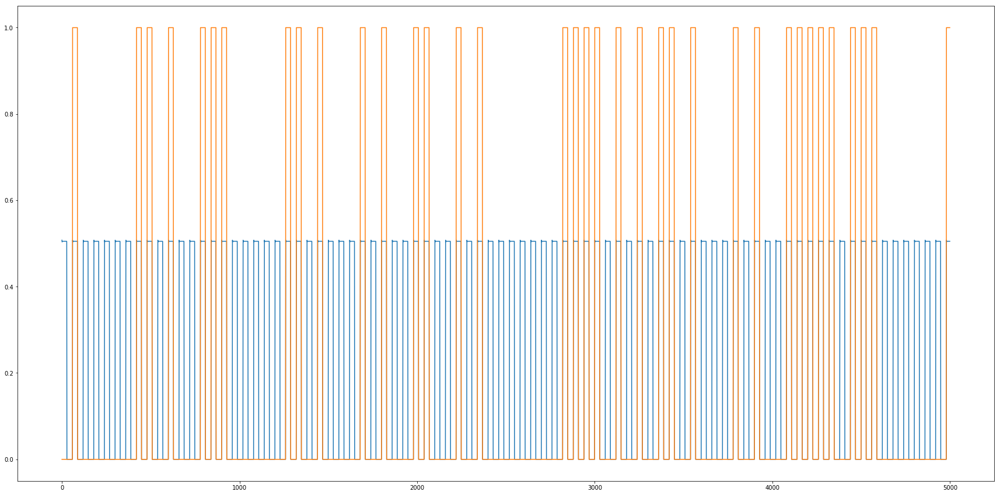

In [50]:
plt.figure(figsize=(30,15))
plt.plot(visualize_train_prediction[start:stop])
plt.plot(visualize_train_real[start:stop])
plt.plot()
plt.show()

In [75]:
123216/60

2053.6

In [74]:
4928640/60/40

2053.6

In [70]:
check_results = np.array(signals.values.iloc[:-8].drop(columns=['target_variable','Iter_Data']))
check_results_Y = np.array(signals.values.iloc[:-8]['target_variable'])
print(check_results.shape)
print(check_results_Y.shape)

(123216, 40)
(123216,)


In [71]:
check_results = check_results.reshape(2053,60,40)
print(check_results.shape)
print(check_results_Y.shape)

ValueError: cannot reshape array of size 4928640 into shape (2053,60,40)

In [54]:
check_prediction = model_dirty.predict(check_results, verbose=1)

ValueError: Error when checking input: expected input_3 to have shape (60, 40) but got array with shape (46, 40)

In [50]:
plot_check_prediction = check_prediction.reshape(123188,1)
plot_check_real = check_results_Y.reshape(123188,1)
print('prediction result shape:', plot_check_prediction.shape)
print('real result_shape:', plot_check_real.shape)

prediction result shape: (123188, 1)
real result_shape: (123188, 1)


In [52]:
start = 0
stop = 5000

# Plot check prediciton 

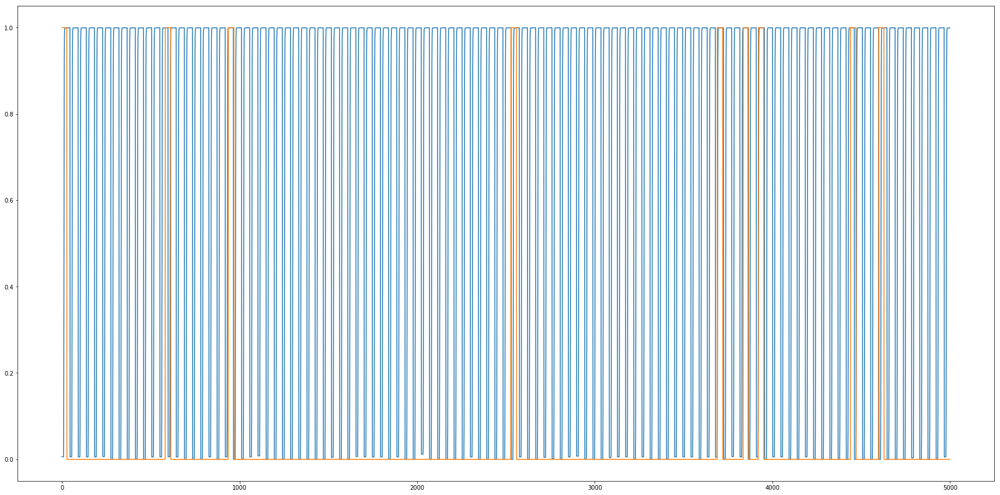

In [53]:
plt.figure(figsize=(30,15))
plt.plot(plot_check_prediction[start:stop])
plt.plot(plot_check_real[start:stop])
plt.plot()
plt.show()

In [69]:
signals.values.head()

,BT28500,BT31200,T22412,F22410,M10I,M10pr,BT33001,M73000rpm,NL,NR,Val1,Val3,Perfomance,Speed,BT22502,M18500,M19000,M22600,Plotnost,TimeWork,M75000A,Recycling,Temp_VAGR,Temp_Enetex,Temp_Gamma,PlotZad,PlotVes,T22101,M27500_AMP,M30000_AMP,BT32600,SP74500,SP73000,AF73000,BT73000,BT27500,BT27501,BT27800,BT27801,BT30000,Iter_Data,target_variable
Data,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-10-01 00:00:00,72.5,18.8,610.4197,7718.278,47.62376,86.54375,9.3,835.00,436.1606,634.0553,338.4006,535.7811,7.593561,13.62550,188.1,42.8,42.4,649.995,33.20988,93,33.1,0.0,27.0,20.4,23.3,45,3.586667,175,79.0,28.4,16.9,-74.48788,-199.4657,61342.79,50.8,47.9,49.6,57.2,48.5,38.5,2018-10-01 00:00:00,1
2018-10-01 00:01:00,72.5,18.9,610.7091,7729.532,48.24580,86.54375,9.4,834.85,437.1268,635.8269,338.4556,539.0161,5.350760,10.22700,188.6,42.4,41.5,649.910,35.92593,93,33.6,0.0,27.2,20.3,23.2,45,3.880000,175,80.6,29.1,17.0,-78.83720,-201.4912,62175.30,43.7,47.6,49.4,57.1,48.5,38.6,2018-10-01 00:01:00,1
2018-10-01 00:02:00,72.2,18.9,610.4197,7723.289,48.31686,86.54375,9.6,835.05,436.7175,635.4152,338.0021,536.9531,7.002241,11.82825,188.5,42.2,41.3,649.910,34.38272,93,33.1,0.0,27.2,20.3,23.2,45,3.713333,175,79.3,28.1,16.9,-75.02137,-199.6828,63716.86,36.5,47.8,49.5,57.0,48.5,38.5,2018-10-01 00:02:00,1
2018-10-01 00:03:00,72.0,18.9,609.8408,7720.808,47.87905,86.55000,9.5,835.05,437.4365,635.6696,338.3430,537.6978,6.361388,11.43275,188.1,42.9,41.4,650.080,35.24692,93,33.8,0.0,27.1,20.3,23.1,45,3.806667,174,79.1,28.6,16.9,-74.13523,-199.1764,64793.66,32.4,47.7,49.4,57.0,48.5,38.6,2018-10-01 00:03:00,1
2018-10-01 00:04:00,72.0,19.0,609.5514,7744.606,47.76055,86.55000,9.6,835.00,436.6059,636.1283,337.3015,538.7716,6.277240,11.52900,188.8,43.2,42.3,650.165,35.12346,93,33.3,0.0,27.0,20.2,23.1,45,3.793333,175,79.3,29.0,17.0,-76.48621,-199.1764,64859.62,30.3,47.7,49.4,57.0,48.5,38.6,2018-10-01 00:04:00,1


In [78]:
sample = signals.values.iloc[(signals.values['target_variable'] != 1).values[:300],]
sample.head(20)

0    117716
Name: target_variable, dtype: int64


In [79]:
clean_condition = (sample.values['M27500_AMP'] >= 79 ).values

clear_target = sample.iloc[clean_condition].values

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

### preparation model on dirty signals 

In [28]:
# Original signal 
print(signals.values.target_variable.value_counts())

signals.values = signals.values.iloc[24:]

X = np.array(signals.values.iloc[:-26400].drop(columns=['target_variable','Iter_Data']))
print(X.shape)
Y = np.array(signals.values.iloc[:-26400]['target_variable'])
print(Y.shape)

X_test = np.array(signals.values.iloc[96800:].drop(columns=['target_variable','Iter_Data']))
print(X_test.shape)
Y_test = np.array(signals.values.iloc[96800:]['target_variable'])
print(Y_test.shape)
# отбросить первые 24 значения 
# Сделать Reshape ввиде 

train_X = X.reshape(110,880,40)
train_Y = Y.reshape(110,880,1)
print(train_X.shape)
print(train_Y.shape)

test_X = X_test.reshape(30,880,40)
test_Y = Y_test.reshape(30,880,1)
print(test_X.shape)
print(test_Y.shape)

0    117716
1      5508
Name: target_variable, dtype: int64
(96800, 40)
(96800,)
(26400, 40)
(26400,)
(110, 880, 40)
(110, 880, 1)
(30, 880, 40)
(30, 880, 1)


### Preparation model on smooth signals 

In [8]:
# Check marking up was successfull 
print(signals.smoothed_values.target_variable.value_counts())

0    117606
1      5508
Name: target_variable, dtype: int64


In [9]:
# For even markup
signals.smoothed_values = signals.smoothed_values.iloc[794:]

print(len(signals.smoothed_values))

X = np.array(signals.smoothed_values.iloc[:-25520].drop(columns=['target_variable','Iter_Data']))
print(X.shape)
Y = np.array(signals.smoothed_values.iloc[:-25520]['target_variable'])
print(Y.shape)

X_test = np.array(signals.smoothed_values.iloc[96800:].drop(columns=['target_variable','Iter_Data']))
print(X_test.shape)
Y_test = np.array(signals.smoothed_values.iloc[96800:]['target_variable'])
print(Y_test.shape)
# Сделать Reshape ввиде 

train_X = X.reshape(110,880,40)
train_Y = Y.reshape(110,880,1)
print(train_X.shape)
print(train_Y.shape)

test_X = X_test.reshape(29,880,40)
test_Y = Y_test.reshape(29,880,1)
print(test_X.shape)
print(test_Y.shape)

122320
(96800, 40)
(96800,)
(25520, 40)
(25520,)
(110, 880, 40)
(110, 880, 1)
(29, 880, 40)
(29, 880, 1)


# Baseline Neural Model configuration 

In [17]:
# Сделать раздельное детектирование аномалий
# Включить последствия аномалий в сигнал и 
# Попробовать дифференцированную разметку аномалий 
# Разметить данные 

In [34]:
from keras.layers import Input, Dense, LSTM, MaxPooling1D, Conv1D
from keras.models import Model
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import TimeDistributed
from keras.layers import Bidirectional
from keras.layers.core import Dense, Activation, Dropout
from keras.layers.recurrent import GRU, LSTM
from keras.layers import Bidirectional, Dense
from keras.optimizers import Adam

# model = Sequential()
# input_layer = Input(shape=(880, 40))
# lstm1 = Bidirectional(LSTM(64,return_sequences=True))(input_layer)
# lstm2 = Bidirectional(LSTM(64,return_sequences=True))(lstm1)
# output_layer = GRU(1, activation="sigmoid", return_sequences=True)(lstm2)
# model = Model(inputs=input_layer, outputs=output_layer)

# input_layer = Input(shape=(880, 40))
# conv1 = Conv1D(filters=32,
#                kernel_size=8,
#                strides=1,
#                activation='relu',
#                padding='same')(input_layer)
# lstm1 = LSTM(32, return_sequences=True)(conv1)
# output_layer = Dense(1, activation='sigmoid')(lstm1)
# model = Model(inputs=input_layer, outputs=output_layer)
# model.compile(loss="binary_crossentropy", optimizer=Adam(lr=1e-4))

input_layer = Input(shape=(46, 40))
conv1 = Conv1D(filters=32,
               kernel_size=8,
               strides=1,
               activation='relu',
               padding='same')(input_layer)
lstm1 = Bidirectional(LSTM(64,return_sequences=True))(conv1)
lstm2 = Bidirectional(LSTM(64,return_sequences=True))(lstm1)
output_layer = GRU(1, activation="sigmoid", return_sequences=True)(lstm2)
model = Model(inputs=input_layer, outputs=output_layer)
model.compile(loss="binary_crossentropy", optimizer="Adam")


# Model training

In [35]:
from sklearn.model_selection import TimeSeriesSplit

tscv = TimeSeriesSplit(n_splits=6)
print(tscv)  

for train_index, test_index in tscv.split(X):
    print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = Y[train_index], Y[test_index]
    print(X_train.shape)
    model.fit(X_train, y_train, epochs=5, batch_size=2)
    model.evaluate(X_test, y_test, verbose=1)
    scores = model.evaluate(X_test, y_test, verbose=1)
    print('test_binary_crossentropy=%f' % scores)
    
print(model.evaluate(X, Y, verbose=1))
# print(model.evaluate(train_X, train_Y, verbose=1))
# , validation_split=0.2

TimeSeriesSplit(max_train_size=None, n_splits=6)
TRAIN: [ 0  1  2  3  4  5  6  7  8  9 10] TEST: [11 12 13 14 15 16 17 18 19 20 21]
(11, 46, 40)


W0729 19:57:06.098179 140466031204096 deprecation_wrapper.py:119] From /usr/local/lib/python3.5/dist-packages/keras/backend/tensorflow_backend.py:986: The name tf.assign_add is deprecated. Please use tf.compat.v1.assign_add instead.



Epoch 1/5
11/11 [==============================] - 4s 351ms/step - loss: 0.5725
Epoch 2/5
11/11 [==============================] - 0s 35ms/step - loss: 0.3902
Epoch 3/5
11/11 [==============================] - 0s 34ms/step - loss: 0.2753
Epoch 4/5
11/11 [==============================] - 0s 35ms/step - loss: 0.1586
Epoch 5/5
11/11 [==============================] - 0s 2ms/step
test_binary_crossentropy=0.094204
TRAIN: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21] TEST: [22 23 24 25 26 27 28 29 30 31 32]
(22, 46, 40)
Epoch 1/5
22/22 [==============================] - 1s 36ms/step - loss: 0.0769
Epoch 2/5
22/22 [==============================] - 1s 34ms/step - loss: 0.0725
Epoch 3/5
22/22 [==============================] - 1s 34ms/step - loss: 0.0575
Epoch 4/5
22/22 [==============================] - 1s 32ms/step - loss: 0.0536
Epoch 5/5
11/11 [==============================] - 0s 1ms/step
test_binary_crossentropy=0.034703
TRAIN: [ 0  1  2  3  4  5  6  7  8  9 10 11 

ValueError: Error when checking input: expected input_5 to have shape (46, 40) but got array with shape (880, 40)

In [36]:
model_json_name = "model_special_markup_t30_dirty.json"
model_h5_name = "model_special_markup_t30_dirty.h5"

In [37]:
# serialize model to JSON
model_json = model.to_json()
with open(model_json_name, "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
model.save_weights(model_h5_name)
print("Saved model to disk")

Saved model to disk


In [38]:
from keras.models import model_from_json
json_file = open(model_json_name, 'r')
loaded_model_json = json_file.read()
json_file.close()
model_dirty = model_from_json(loaded_model_json)
# load weights into new model
model_dirty.load_weights(model_h5_name)
print("Loaded TRANSVERS model from disk")
# test_prediction = model_dirty.predict(test_X, verbose=1)
train_prediciton = model_dirty.predict(X, verbose=1)


# print(test_prediction.shape)
print(train_prediciton.shape)

# visualize_test_prediction = test_prediction.reshape(29*880,1)
# visualize_train_prediction = train_prediciton.reshape(110*880,1)
# visualize_test_prediction = test_prediction.reshape(77*46,1)
visualize_train_prediction = train_prediciton.reshape(77*46,1)

# visualize_test_real = test_Y.reshape(29*880,1)
# visualize_train_real = train_Y.reshape(110*880,1)
# visualize_test_real.shape
visualize_train_real = Y.reshape(77*46,1)
start = 0 
stop = 1000

Loaded TRANSVERS model from disk
77/77 [==============================] - 1s 9ms/step


(77, 46, 1)


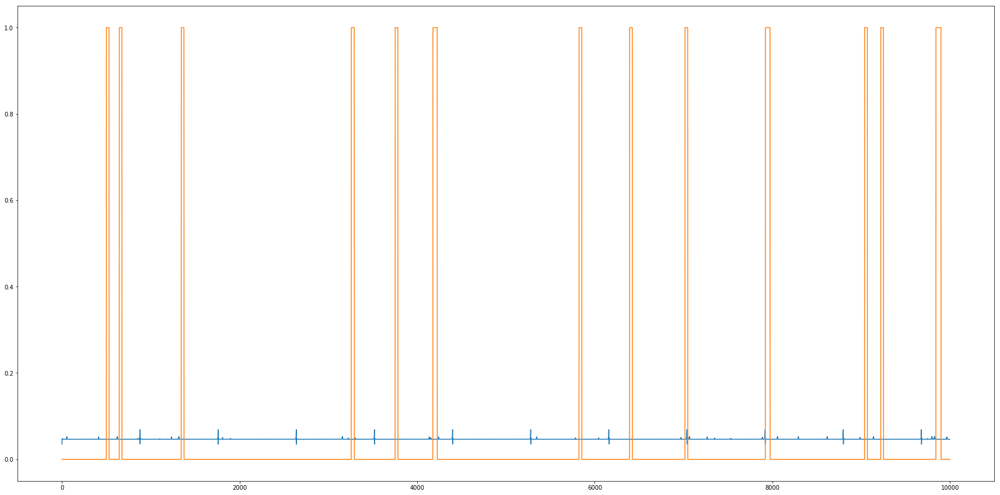

In [26]:
plt.figure(figsize=(30,15))
plt.plot(visualize_test_prediction[start:stop])
plt.plot(visualize_test_real[start:stop])
plt.plot()
# plt.savefig('first_baseline.png')
plt.show()

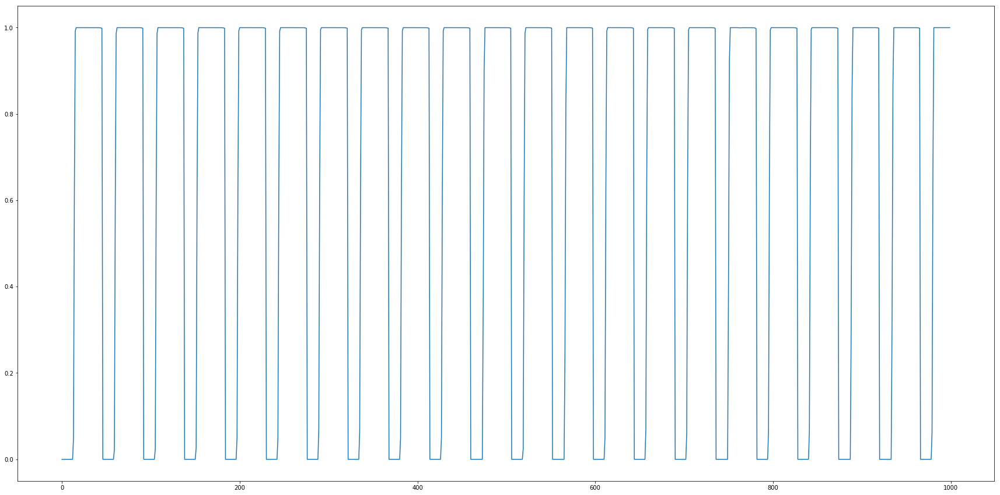

In [52]:
plt.figure(figsize=(30,15))
plt.plot(visualize_train_prediction[0:1000])
# plt.plot(visualize_train_real[0:10])
plt.plot()
plt.show()

# Build PCA

In [9]:
from sklearn.datasets import fetch_mldata
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

%matplotlib inline
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

import seaborn as sns

In [31]:
pca = PCA(n_components=3)
pca_result = pca.fit_transform(signals.smoothed_values.values)

signals.smoothed_values['pca-one'] = pca_result[:,0]
signals.smoothed_values['pca-two'] = pca_result[:,1] 
signals.smoothed_values['pca-three'] = pca_result[:,2]

print('Объясненная вариация по основному компоненту: {}'.format(pca.explained_variance_ratio_))

Объясненная вариация по основному компоненту: [1.00000000e+00 2.16522530e-23 4.42975863e-26]


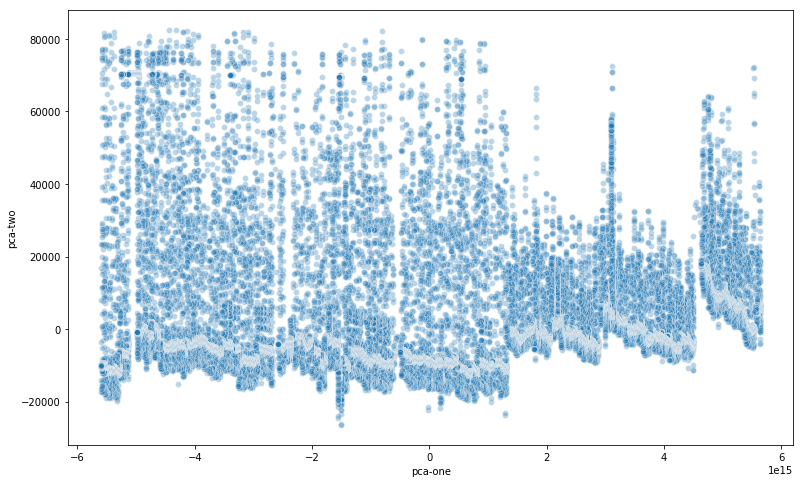

In [32]:
plt.figure(figsize=(13,8))
sns.scatterplot(
    x="pca-one", y="pca-two",
    palette=sns.color_palette("hls", 10),
    data=signals.smoothed_values,
    legend="full",
    alpha=0.3
)

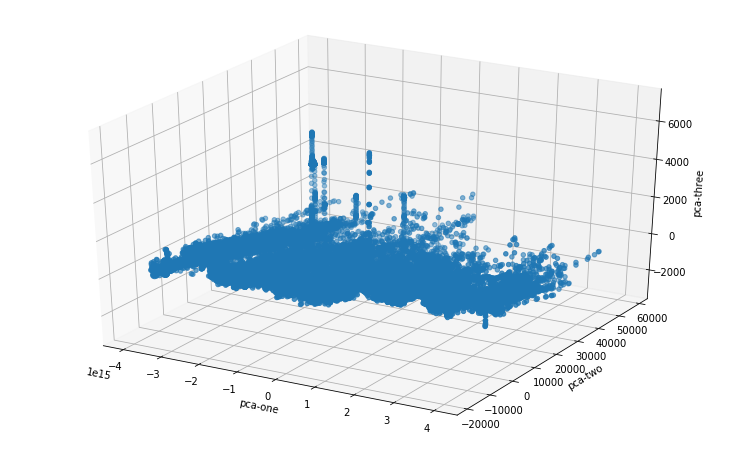

In [21]:
ax = plt.figure(figsize=(13,8)).gca(projection='3d')
ax.scatter(
    xs=signals.smoothed_values["pca-one"], 
    ys=signals.smoothed_values["pca-two"], 
    zs=signals.smoothed_values["pca-three"], 
    cmap='tab10'
)
ax.set_xlabel('pca-one')
ax.set_ylabel('pca-two')
ax.set_zlabel('pca-three')moving
plt.show()

In [61]:
signals.smoothed_values.info()
print(signals.smoothed_values["target_variable"].value_counts())

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 132398 entries, 2018-10-01 00:00:00 to 2018-12-31 23:58:00
Data columns (total 42 columns):
BT28500            132398 non-null float64
BT31200            132398 non-null float64
T22412             132398 non-null float64
F22410             132398 non-null float64
M10I               132398 non-null float64
M10pr              132398 non-null float64
BT33001            132398 non-null float64
M73000rpm          132398 non-null float64
NL                 132398 non-null float64
NR                 132398 non-null float64
Val1               132398 non-null float64
Val3               132398 non-null float64
Perfomance         132398 non-null float64
Speed              132398 non-null float64
BT22502            132398 non-null float64
M18500             132398 non-null float64
M19000             132398 non-null float64
M22600             132398 non-null float64
Plotnost           132398 non-null float64
TimeWork           132398 non-null flo

In [10]:
import time
time_start = time.time()
tsne = TSNE(n_components=3, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(signals.smoothed_values.drop(["Iter_Data", "target_variable"], axis=1))
# print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 123114 samples in 0.449s...
[t-SNE] Computed neighbors for 123114 samples in 19.356s...
[t-SNE] Computed conditional probabilities for sample 1000 / 123114
[t-SNE] Computed conditional probabilities for sample 2000 / 123114
[t-SNE] Computed conditional probabilities for sample 3000 / 123114
[t-SNE] Computed conditional probabilities for sample 4000 / 123114
[t-SNE] Computed conditional probabilities for sample 5000 / 123114
[t-SNE] Computed conditional probabilities for sample 6000 / 123114
[t-SNE] Computed conditional probabilities for sample 7000 / 123114
[t-SNE] Computed conditional probabilities for sample 8000 / 123114
[t-SNE] Computed conditional probabilities for sample 9000 / 123114
[t-SNE] Computed conditional probabilities for sample 10000 / 123114
[t-SNE] Computed conditional probabilities for sample 11000 / 123114
[t-SNE] Computed conditional probabilities for sample 12000 / 123114
[t-SNE] Computed conditional proba

[t-SNE] KL divergence after 250 iterations with early exaggeration: 85.770294


KeyboardInterrupt: 

In [ ]:
print(tsne_results)

In [11]:
signals.smoothed_values['tsne-2d-one'] = 0
signals.smoothed_values['tsne-2d-two'] = 0
signals.smoothed_values['tsne-2d-one'] = tsne_results[:,0]
signals.smoothed_values['tsne-2d-two'] = tsne_results[:,1]
plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="target_variable",
    data=signals.smoothed_values.drop(["Iter_Data"], axis=1),
    legend="full",
    alpha=0.3
)

# sns.lmplot(x="tsne-2d-one", y="tsne-2d-two",
#           data=signals.values.drop(["Iter_Data"], axis=1)[:50000],
#            fit_reg=False,
           
#           )

NameError: name 'tsne_results' is not defined

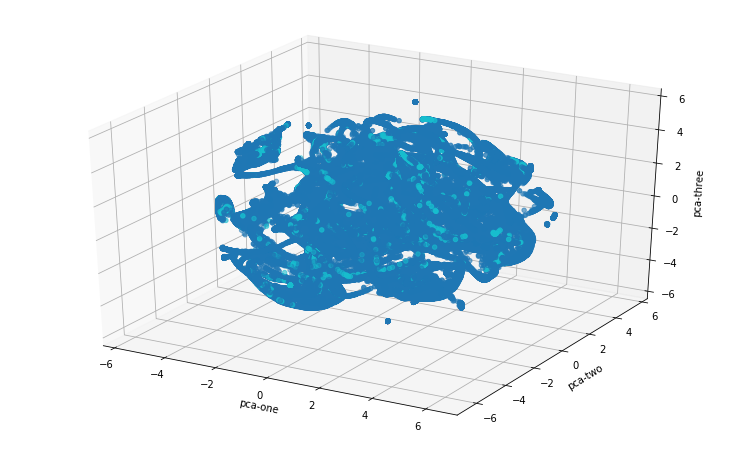

In [46]:
signals.smoothed_values['tsne-3d-one'] = 0
signals.smoothed_values['tsne-3d-two'] = 0
signals.smoothed_values['tsne-3d-three'] = 0
signals.smoothed_values['tsne-3d-one'] = tsne_results[:,0]
signals.smoothed_values['tsne-3d-two'] = tsne_results[:,1]
signals.smoothed_values['tsne-3d-three'] = tsne_results[:,2]

ax = plt.figure(figsize=(13,8)).gca(projection='3d')
ax.scatter(
    xs=signals.smoothed_values["tsne-3d-one"], 
    ys=signals.smoothed_values["tsne-3d-two"], 
    zs=signals.smoothed_values["tsne-3d-three"], 
    c=signals.smoothed_values["target_variable"], 
    cmap='tab10',
)
ax.set_xlabel('pca-one')
ax.set_ylabel('pca-two')
ax.set_zlabel('pca-three')
plt.show()

# Some Scripts

In [ ]:
for column in data.columns[1:]:
        export_csv = data[["Data",column]].to_csv (r'datasets/DATA/Nikol/MVP_samples_2/' + column +'.csv', index = None, header=True)

In [ ]:
### My script for reading target info
rb = xlrd.open_workbook('datasets/DATA/Nikol/Л1-2018/10akt.xlsm')
additional_info = pd.DataFrame(columns=["name", "start_rasplav", "end_rasplav", "total_minute", "reason", "loss_tn"])
for sheet in rb.sheets()[3:]:
    print(sheet.name)
    for row in range(15,24):
        # write into structure
        name = sheet.cell_value(row,0)
        if sheet.cell_type(row,8) == xlrd.XL_CELL_EMPTY:
            continue
        start_rasplav = xlrd.xldate_as_tuple(sheet.cell_value(row,8), rb.datemode)
        end_rasplav = xlrd.xldate_as_tuple(sheet.cell_value(row,9), rb.datemode)
        total = xlrd.xldate_as_tuple(sheet.cell_value(row,10), rb.datemode)
        reason = sheet.cell_value(row,11)
        loss_tn = sheet.cell_value(row,30)
        
        additional_info = additional_info.append(pd.Series(
            [name, str(start_rasplav[4]) + ":" + str(start_rasplav[5]), str(end_rasplav[4]) + ":" +str(end_rasplav[5]), total[4], reason, loss_tn],
            index=["name", "start_rasplav", "end_rasplav", "total_minute", "reason", "loss_tn"]),ignore_index=True)
        
    

In [ ]:
### read all amount off acts data 
for sheet in rb.sheets()[3:4]:
    number_of_rows = sheet.nrows
    number_of_columns = sheet.ncols

    items = []
    print(sheet.name)
    rows = []
    for row in range(0, number_of_rows):
        values = []
        for col in range(number_of_columns):
            value  = (sheet.cell(row,col).value)
            try:
                value = str(int(value))
            except ValueError:
                pass
            finally:
                values.append([value,row,col])
                
        print(values)

In [28]:
# signals.values = signals.values.merge(target,on=['Data','START_DATE'],how='outer')
# # df = pd.concat([signals.values, target], axis=1)
# # df.head()
# signals.values.head()
# result = pd.merge(signals.values, target, how='outer')


# result = signals.values.join(target[['test_index','START_DATE','END_DATE','STOP_TIME']], how='outer')


# result['test_index'] = result['test_index'].fillna(0)
# signals.values.merge(target,left_index=True, right_index=True,how='outer')
# signals.values.info()
# result = result.dropna()


# result.head()


# Через iloc применить заполнение 
# Условие
# m1 = (result>= 0) & (result['START_DATE'] <= 43)
# Заполнение NAN по условию 
# df.loc[m1,'b'].fillna(df.loc[m1,'b'].median())

20915

In [29]:
20915 - 17377

3538

In [ ]:
from dateutil import parser
dt = parser.parse("2018-10-01 00:27:00 AM")